In [1]:
%matplotlib inline

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
%load_ext rpy2.ipython

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:14: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


# Import scripts

In [4]:
path_scripts = '/Users/simjoo/Projects/10X_aging/scripts/v3/'

In [5]:
import sys
sys.path.append(path_scripts)

In [6]:
from ipyparallel import Client
import csv
import os
import pickle
import scipy.io
import scanpy as sc
import anndata
import bbknn
import statsmodels.api as sm
import diffxpy.api as de
import scanpy.external as sce
import gseapy as gp
import ternary

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/numba/core/cpu.py:77: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  numba.core.entrypoints.init_all()


In [7]:
%%R
library(Seurat)
library(SingleCellExperiment)
library(scran)
library(DESeq2)
library(igraph)
library(MAST)

R[write to console]: Loading required package: SummarizedExperiment

R[write to console]: Loading required package: GenomicRanges

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    Filter, Find, Map, Position, Reduce, anyDuplicated, append,
    as.data.frame, basename, cbind, colnames, dirname, do.call,
    duplicated, eval, evalq, get, grep, grepl, intersect, is.unsorted

In [8]:
from TenX_aging_misc_scripts_v1_0 import *
from TenX_aging_plot_v1_0 import *
from TenX_aging_mann_whitney_u_v1_0 import *

In [9]:
#exp_id = create_ID()

In [10]:
exp_id = '202111251525'
path_input = '/Users/simjoo/Projects/10X_aging/data_input/'
path_output = '/Users/simjoo/Projects/10X_aging/data_output/v3/'
path_figures = '/Users/simjoo/Projects/10X_aging/figures/v3/'

In [11]:
cmap_tab20 = {str(c) : mpl.colors.rgb2hex(plt.cm.tab20(c/20)) for c in range(20)}
cmap_tissue = {'KP':'#e31a1c', 'KPL':'#1f78b4', 'KPLR':'#ff7f00', 'KPR':'#6a3d9a', 'KPT':'#e7298a', 'healthy':'#33a02c'}
cmap_age = {'young': '#377eb8', 'aged': '#e41a1c'}
cmap_tumor_age = {'KP_young':'#fb9a99','KP_aged':'#e31a1c',
                  'KPL_young':'#a6cee3','KPL_aged':'#1f78b4',
                  'KPLR_young':'#fdbf6f','KPLR_aged':'#ff7f00',
                  'KPR_young':'#cab2d6','KPR_aged':'#6a3d9a',
                  'KPT_young':'#e78ac3','KPT_aged':'#e7298a',
                  'healthy_young':'#b2df8a','healthy_aged':'#33a02c'}
cmap_tumor_stage = {'healthy':'#33a02c',
                    '4wk':'#1f78b4',
                    '12wk':'#6a3d9a',
                    '17-18wk':'#ff7f00',
                    '19-20wk':'#e31a1c',}
cmap_epithelial_tumor = {'AT2-like': '#b2df8a',
                         'AT2': '#33a02c',
                         'High plasticity cell state': '#a50f15',
                         'AT1-like': '#fb6a4a',
                         'Ribosome high': '#c51b7d',
                         'Endoderm-like': '#542788',
                         'AT1': '#e6ab02',
                         'Ciliated':'#666666', 
                         'Other':'silver'}

# Initialize engines

In [12]:
c = Client()

TimeoutError: Hub connection request timed out

In [ ]:
dview = c[:]

In [ ]:
dview.execute('import sys')
dview.execute('sys.path.append("/Users/simjoo/Projects/10X_aging/scripts/v3/")')
dview.execute('from TenX_aging_misc_scripts_v1_0 import *')
dview.execute('from TenX_aging_plot_v1_0 import *')
dview.execute('from TenX_aging_mann_whitney_u_v1_0 import *')

# Clustering of KP tumor cells

In [16]:
X = sc.read_h5ad('%s/%s_X_LUAD_aging_pp.h5' % (path_output, exp_id))

In [16]:
Xs = sc.read_h5ad('%s/%s_Xs_LUAD_aging_all.h5' % (path_output, exp_id))

In [17]:
X = X[Xs.obs_names]

In [18]:
X.obs['cl_all_pca'] = Xs.obs['cl_all_pca']
X.obs['cl_all_nmf'] = Xs.obs['cl_all_nmf']
X.obsm['X_umap_all_pca'] = Xs.obsm['X_umap_pca']
X.obsm['X_umap_all_nmf'] = Xs.obsm['X_umap_nmf']

Trying to set attribute `.obs` of view, copying.


In [19]:
X.X = X.layers['norm_log2']

## Select epithelial / tumor cells

In [20]:
c_sel = X.obs[X.obs['cl_all_pca']=='Epithelial cells'].index

In [21]:
len(c_sel)

49416

In [22]:
Xs = X[c_sel]

## Cell cycle prediction

In [23]:
genes_s = open('%s/s-genes.txt' % path_input).read().split()
genes_g2m = open('%s/g2m-genes.txt' % path_input).read().split()

In [24]:
sc.tl.score_genes_cell_cycle(Xs, s_genes=genes_s, g2m_genes=genes_g2m)

Trying to set attribute `.obs` of view, copying.


## Randomly subsample cells

In [25]:
Xs.obs['stage*age'] = ['%s_%s' % (Xs.obs['tumor_stage'][i], Xs.obs['age'][i]) for i in Xs.obs_names]

In [26]:
Counter(Xs.obs['stage*age'])

Counter({'healthy_aged': 2161,
         'healthy_young': 1922,
         '4wk_aged': 2535,
         '4wk_young': 3559,
         '12wk_aged': 8830,
         '12wk_young': 17040,
         '17-18wk_young': 5116,
         '19-20wk_young': 2850,
         '19-20wk_aged': 3283,
         '17-18wk_aged': 2120})

In [27]:
c_sel = []
n = 3000
for gr in set(Xs.obs['stage*age']):
    c_tmp = list(Xs.obs[Xs.obs['stage*age']==gr].index)
    if len(c_tmp) <= n:
        c_sel += list(c_tmp)
    else:
        c_sel += list(np.random.choice(c_tmp, n, replace=False))

In [28]:
len(c_sel)

26588

In [29]:
Xs = Xs[c_sel]

## Feature selection - gene filtering

In [30]:
pdX = sc2pd(Xs[c_sel], 'norm')

In [31]:
pdX = filter_genes(pdX, min_mean=0.05)
pdX = filter_genes(pdX, min_cells=len(pdX.columns)*0.025)

54838 genes in dataset
After removing genes with mean expression of less than 0.05 reads, 9322 genes remain
9322 genes in dataset
After removing genes expressed in less than 664.7 cells, 9302 genes remain


## Feature selection - VST

In [32]:
feat = select_features_vst(pdX, 2500)

In [33]:
Xs = Xs[:,feat]

## Regression of cell cycle

In [34]:
sc.pp.regress_out(Xs, ['S_score', 'G2M_score'])

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'phase' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'stage*age' as categorical


## Dimensionality reduction - PCA & NMF

In [35]:
from sklearn.decomposition import NMF

In [36]:
pdX = sc2pd(Xs, 'X', sparse=False)

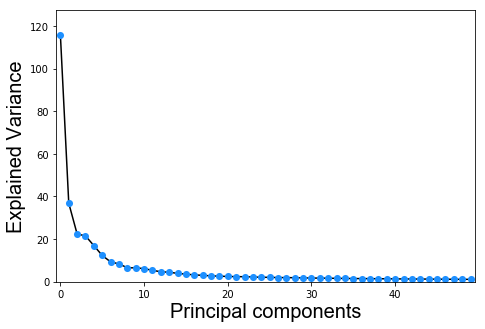

In [37]:
draw_pca_explained_var(pdX)

In [38]:
dim = 20
pca = PCA(n_components=dim)
pca.fit(pdX.T)
pcs = pd.DataFrame(pca.transform(pdX.T), columns = range(dim), index = pdX.columns)
Xs.obsm['X_pca'] = np.array(pcs)

In [39]:
pdX_nmf = pdX.copy()
pdX_nmf[pdX_nmf<0] = 0 #to force NMF
dim = 50
nmf = NMF(n_components=dim)
nmf.fit(pdX_nmf.T)
nmfs = pd.DataFrame(nmf.transform(pdX_nmf.T), columns = range(dim), index = pdX_nmf.columns)
Xs.obsm['X_nmf'] = np.array(nmfs)

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/sklearn/decomposition/_nmf.py:1077: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


## UMAP - PCA

In [40]:
bbknn.bbknn(Xs, batch_key='mouse', neighbors_within_batch=1, use_rep='X_pca', metric='euclidean')

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/bbknn/__init__.py:294: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/bbknn/__init__.py:295: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


In [41]:
sc.tl.umap(Xs, min_dist=0.5, spread=5)

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/umap/umap_.py:1158: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


In [42]:
Xs.obsm['X_umap_pca'] = Xs.obsm['X_umap']

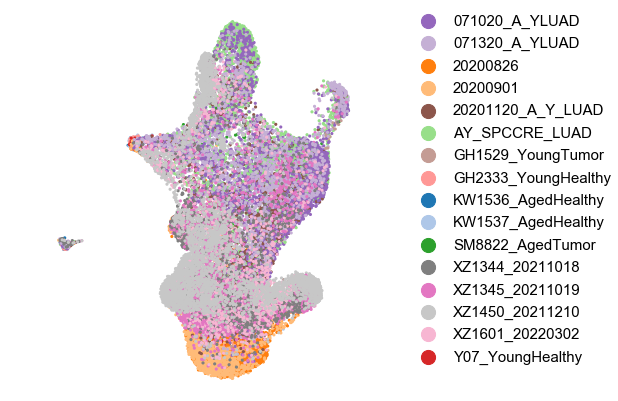

In [43]:
draw_scatter_groups(Xs.obsm['X_umap_pca'], 
                    Xs.obs['batch'], 
                    s=10, show_axes = False)

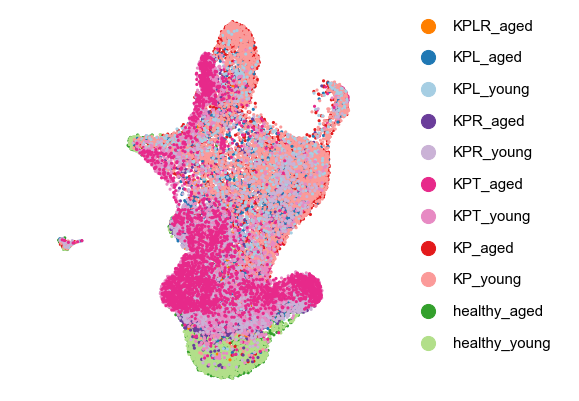

In [44]:
draw_scatter_groups(Xs.obsm['X_umap_pca'], 
                    Xs.obs['tumor*age'],
                    cmap_tumor_age,
                    s=10, show_axes = False)

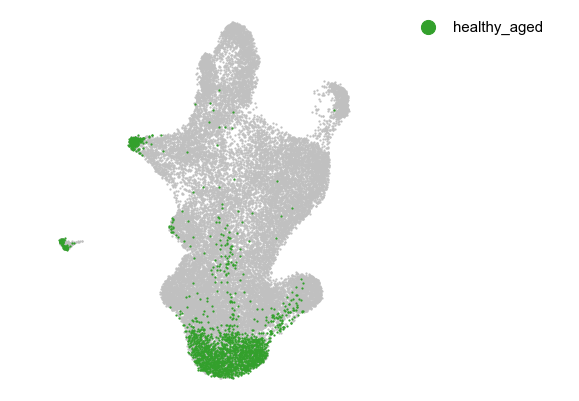

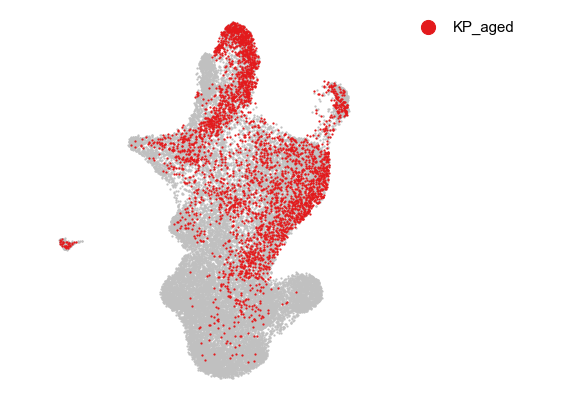

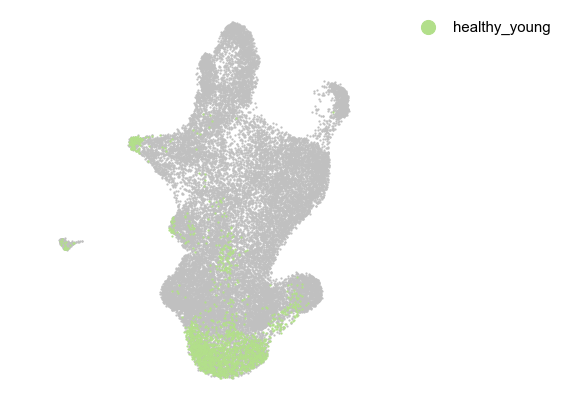

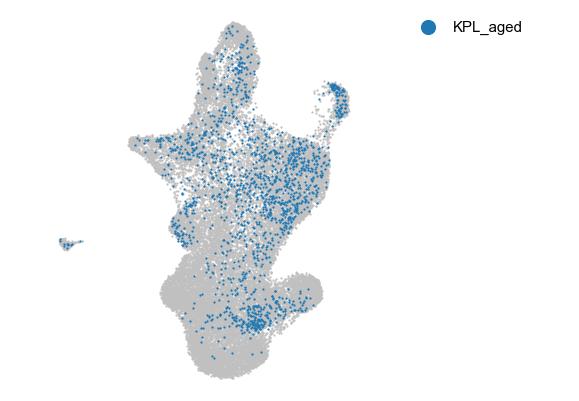

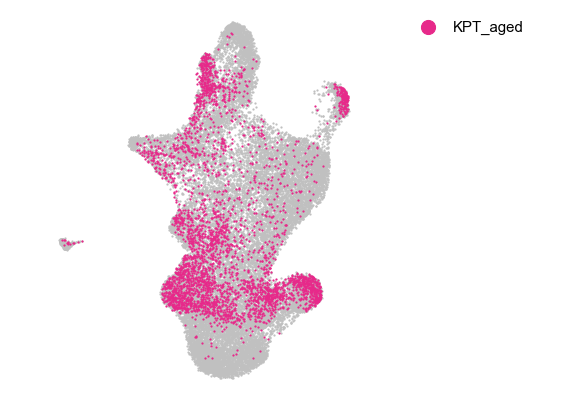

...

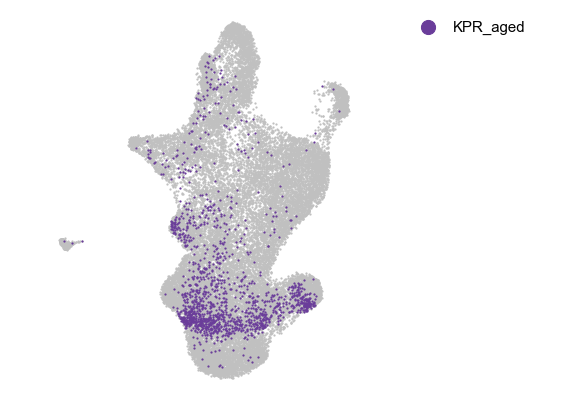

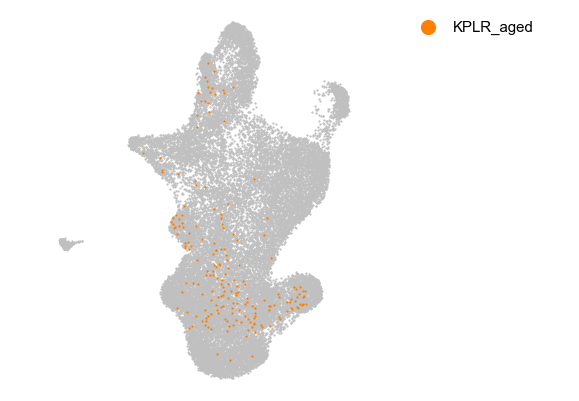

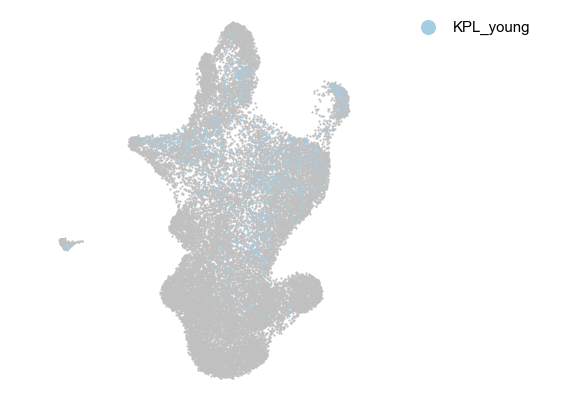

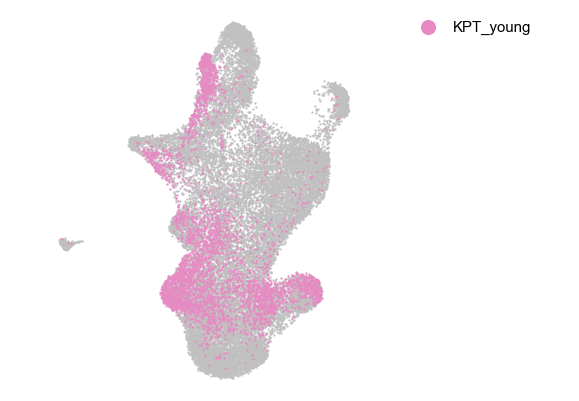

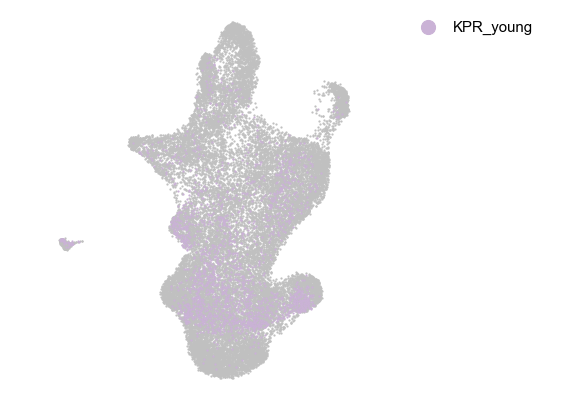

In [45]:
draw_scatter_groups_individual(Xs.obsm['X_umap_pca'], 
                               Xs.obs['tumor*age'],
                               cmap = cmap_tumor_age,
                               s=5, show_axes=False)

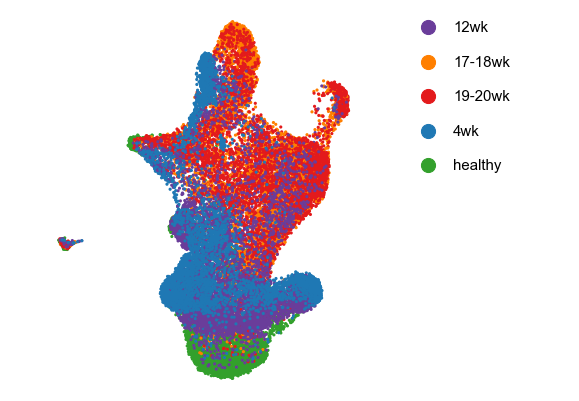

In [46]:
draw_scatter_groups(Xs.obsm['X_umap_pca'], 
                    Xs.obs['tumor_stage'],
                    cmap=cmap_tumor_stage,
                    s=10, show_axes = False)

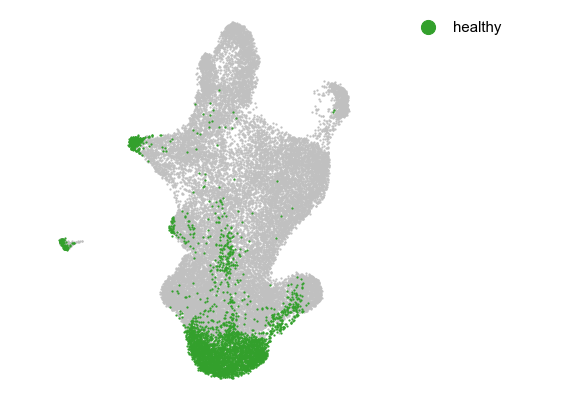

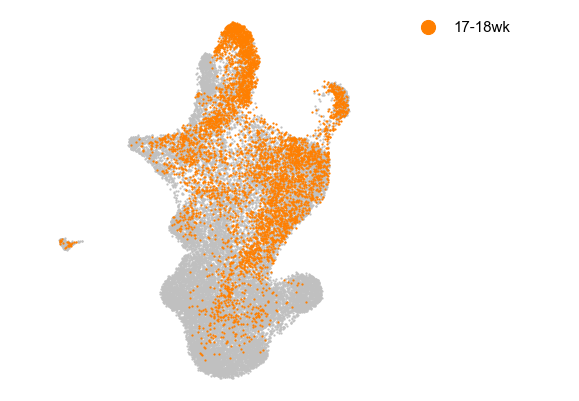

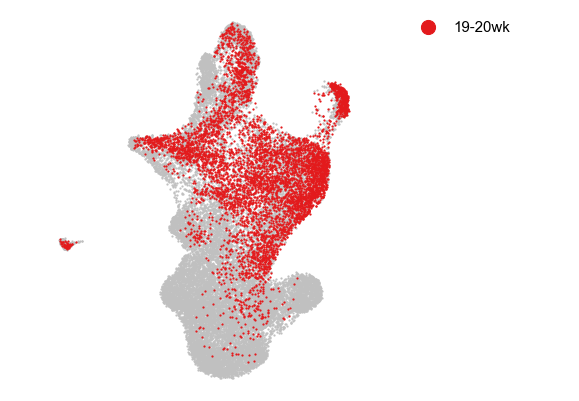

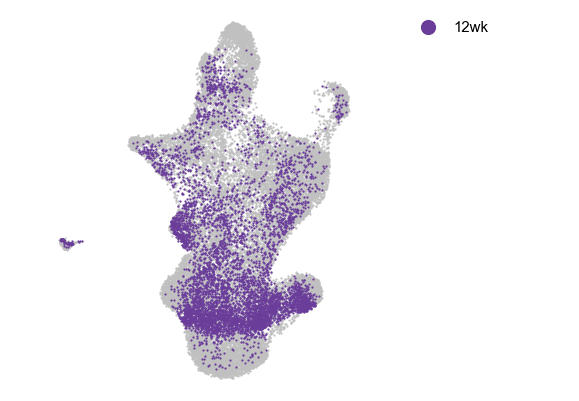

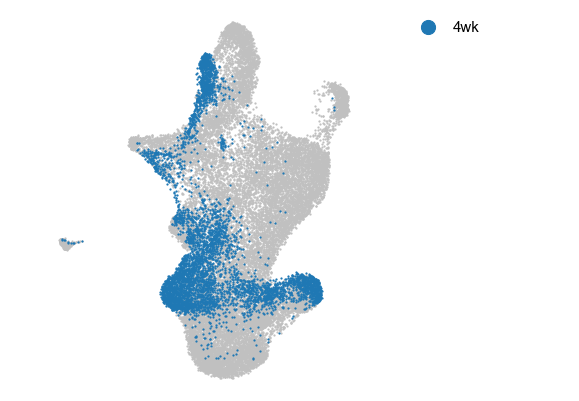

In [47]:
draw_scatter_groups_individual(Xs.obsm['X_umap_pca'], 
                               Xs.obs['tumor_stage'],
                               cmap=cmap_tumor_stage,
                               s=5, show_axes=False)

## Marker genes - PCA

In [17]:
pdX = sc2pd(X, 'norm_log2')

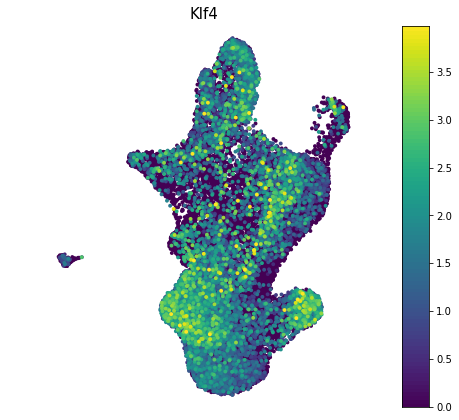

In [19]:
g = 'Klf4'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

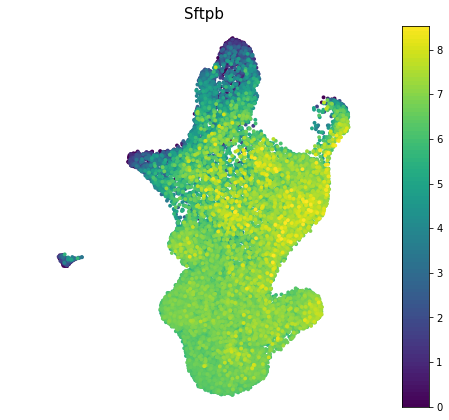

In [49]:
g = 'Sftpb'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

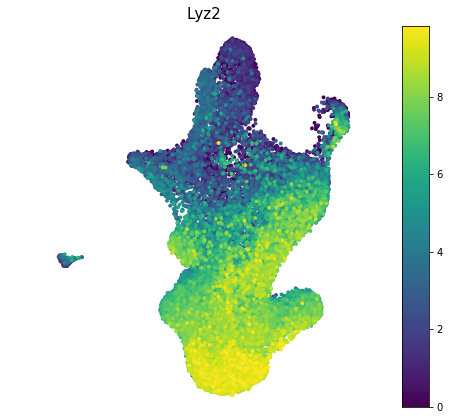

In [50]:
g = 'Lyz2'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

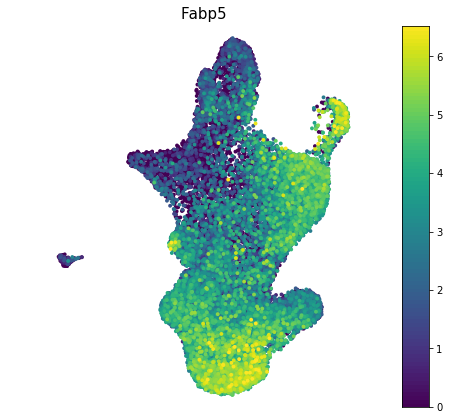

In [51]:
g = 'Fabp5'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

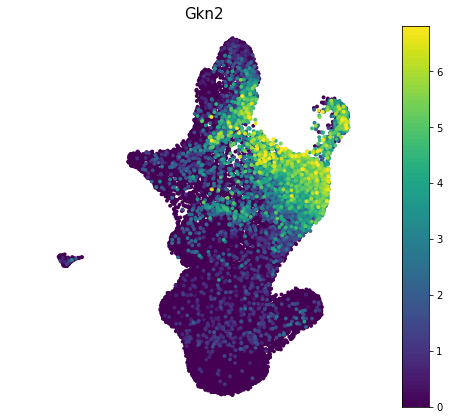

In [52]:
g = 'Gkn2'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

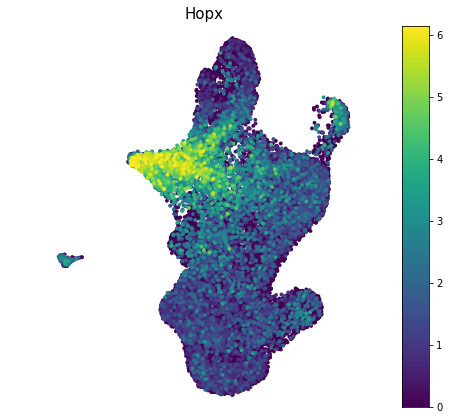

In [53]:
g = 'Hopx'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

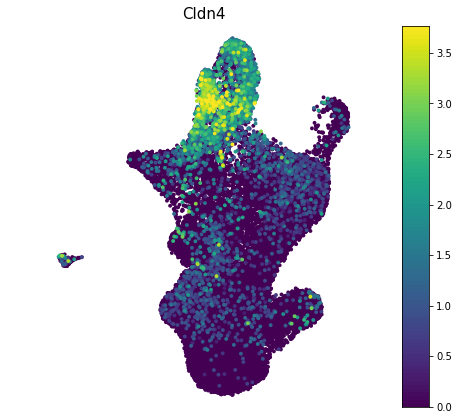

In [54]:
g = 'Cldn4'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

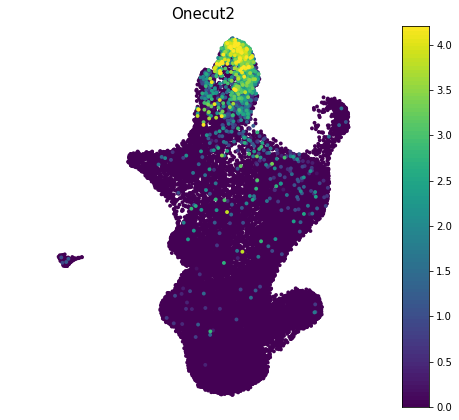

In [55]:
g = 'Onecut2'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

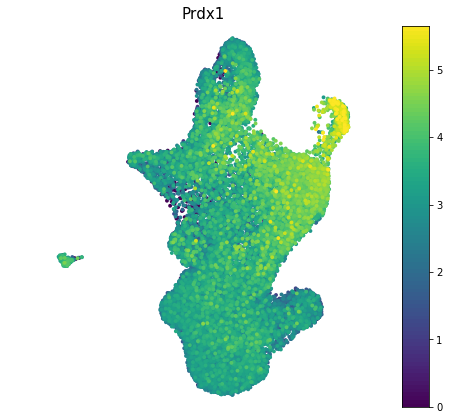

In [56]:
g = 'Prdx1'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

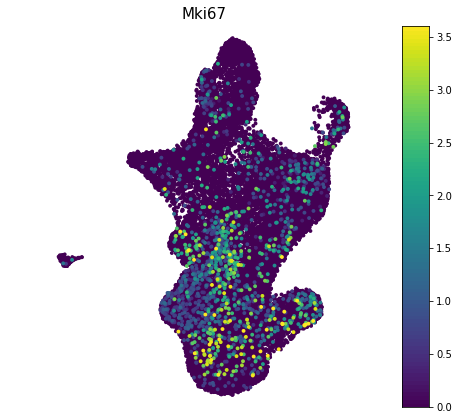

In [57]:
g = 'Mki67'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

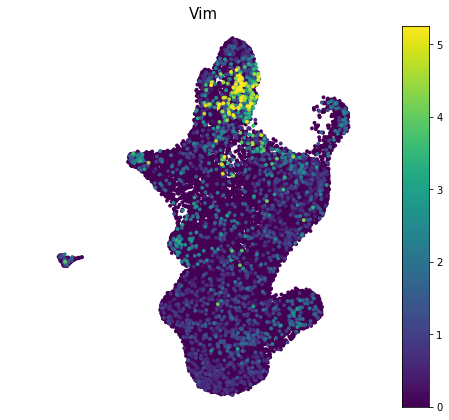

In [58]:
g = 'Vim'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

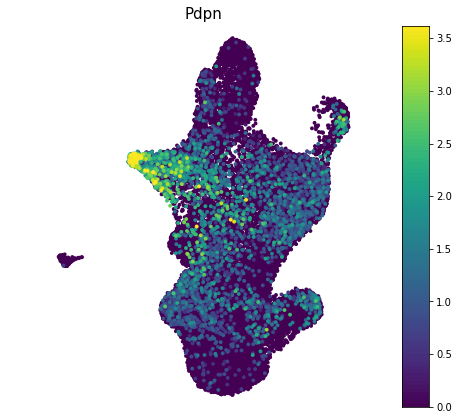

In [59]:
g = 'Pdpn'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 0.1),
                  np.percentile(expr, 99.9),
                  text = g,
                  s = 15, show_axes=False)

## Leiden clustering - PCA

In [98]:
sc.tl.leiden(Xs, resolution=0.5)

In [99]:
len(set(Xs.obs['leiden']))

8

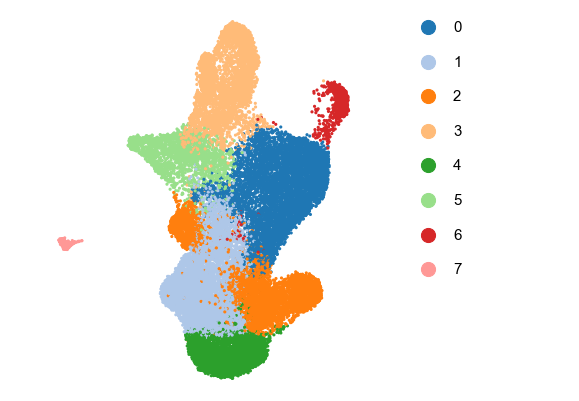

In [100]:
draw_scatter_groups(Xs.obsm['X_umap_pca'], 
                    Xs.obs['leiden'],
                    cmap_tab20,
                    s=10, show_axes=False)

## Assign cluster identities - PCA

In [101]:
cl_epithelial_tumor = pd.Series(None, index = Xs.obs_names)

for c in Xs.obs[Xs.obs['leiden'].isin(['4'])].index:
    cl_epithelial_tumor[c] = 'AT2'
    
for c in Xs.obs[(Xs.obs['leiden'].isin(['5']))&(Xs.obs['tumor_stage']=='healthy')].index:
    cl_epithelial_tumor[c] = 'AT1'
    
for c in Xs.obs['leiden'][Xs.obs['leiden'].isin(['7'])].index:
    cl_epithelial_tumor[c] = 'Ciliated'
    
for c in Xs.obs['leiden'][Xs.obs['leiden'].isin(['1','2'])].index:
    cl_epithelial_tumor[c] = 'AT2-like'
    
for c in Xs.obs['leiden'][Xs.obs['leiden'].isin(['0'])].index:
    cl_epithelial_tumor[c] = 'Endoderm-like'
    
for c in Xs.obs[(Xs.obs['leiden'].isin(['5']))&(Xs.obs['tumor_stage']!='healthy')].index:
    cl_epithelial_tumor[c] = 'AT1-like'
    
for c in Xs.obs['leiden'][Xs.obs['leiden'].isin(['3'])].index:
    cl_epithelial_tumor[c] = 'High plasticity cell state'
    
for c in Xs.obs['leiden'][Xs.obs['leiden'].isin(['6'])].index:
    cl_epithelial_tumor[c] = 'Ribosome high'

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  """Entry point for launching an IPython kernel.


In [102]:
Counter(cl_epithelial_tumor)

Counter({'AT2': 3397,
         'AT2-like': 10112,
         'AT1': 308,
         'High plasticity cell state': 3886,
         'Endoderm-like': 5944,
         'Ciliated': 242,
         'Ribosome high': 809,
         'AT1-like': 1890})

In [103]:
Xs.obs['cl_epithelial_tumor_pca'] = cl_epithelial_tumor

In [30]:
cmap_epithelial_tumor = {'AT2-like': '#b2df8a',
                         'AT2': '#33a02c',
                         'High plasticity cell state': '#a50f15',
                         'AT1-like': '#fb6a4a',
                         'Ribosome high': '#c51b7d',
                         'Endoderm-like': '#542788',
                         'AT1': '#e6ab02',
                         'Ciliated':'#666666', 
                         'Other':'silver'}

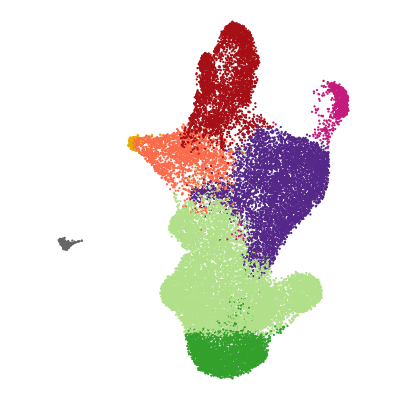

In [34]:
draw_scatter_groups(Xs.obsm['X_umap_pca'], 
                    Xs.obs['cl_epithelial_tumor_pca'],
                    cmap_epithelial_tumor,
                    s=5, show_axes=False, show_legend=False)

figname = 'umap_LUAD_pop.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Cell cycle enrichment

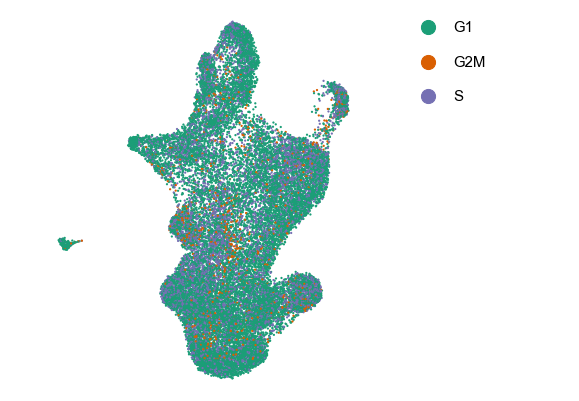

In [162]:
draw_scatter_groups(Xs[c_sel].obsm['X_umap_pca'], 
                    Xs[c_sel].obs['phase'], 
                    {'G1':'#1b9e77','S':'#7570b3','G2M':'#d95f02'},
                    s = 5, show_axes=False)

## Checkpoint

In [164]:
Xs.write_h5ad('%s/%s_Xs_LUAD_aging_KP_tumor_subsampled.h5' % (path_output, exp_id))

... storing 'cl_epithelial_tumor_pca' as categorical
... storing 'cl_epithelial_tumor_nmf' as categorical


# Visualization of gene expression

In [12]:
X = sc.read_h5ad('%s/%s_X_LUAD_aging_pp.h5' % (path_output, exp_id))

In [13]:
Xs = sc.read_h5ad('%s/%s_Xs_LUAD_aging_KP_tumor_subsampled.h5' % (path_output, exp_id))

## Gene expresison on UMAP divided by age

In [14]:
c_young = Xs.obs[Xs.obs['age']=='young'].index
c_aged = Xs.obs[Xs.obs['age']=='aged'].index

In [15]:
print(len(c_young), len(c_aged))

13772 12816


In [15]:
pdX = sc2pd(X, 'norm_log2')

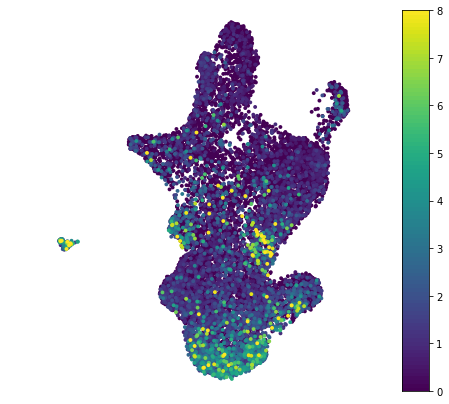

In [30]:
g = 'Scgb1a1'
expr = pdX.loc[g, c_young]
draw_scatter_expr(Xs[c_young].obsm['X_umap_pca'],
                  expr,
                  0,
                  8,
                  text = '',
                  s = 15, show_axes=False, show_legend=True)

figname = 'umap_exp_young_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

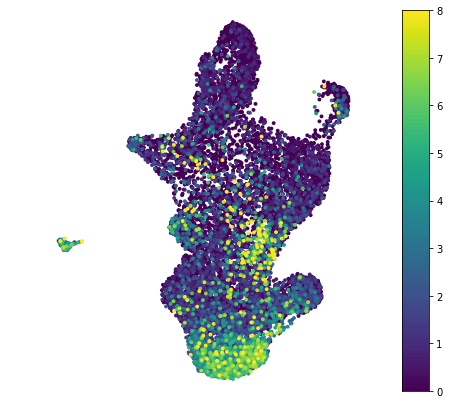

In [31]:
g = 'Scgb1a1'
expr = pdX.loc[g, c_aged]
draw_scatter_expr(Xs[c_aged].obsm['X_umap_pca'],
                  expr,
                  0,
                  8,
                  text = '',
                  s = 15, show_axes=False, show_legend=True)

figname = 'umap_exp_aged_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

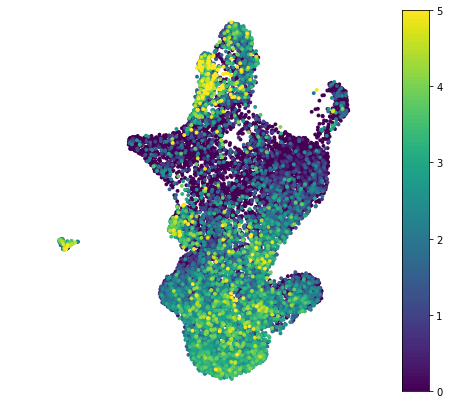

In [32]:
g = 'Nupr1'
expr = pdX.loc[g, c_young]
draw_scatter_expr(Xs[c_young].obsm['X_umap_pca'],
                  expr,
                  0,
                  5,
                  text = '',
                  s = 15, show_axes=False)

figname = 'umap_exp_young_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

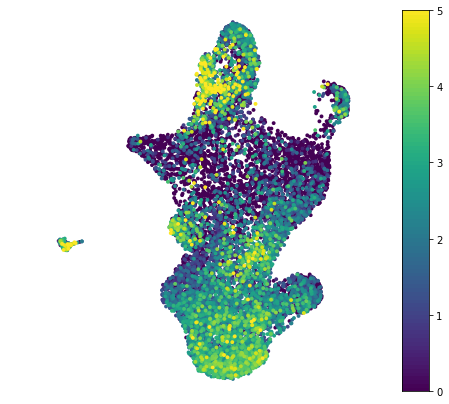

In [33]:
g = 'Nupr1'
expr = pdX.loc[g, c_aged]
draw_scatter_expr(Xs[c_aged].obsm['X_umap_pca'],
                  expr,
                  0,
                  5,
                  text = '',
                  s = 15, show_axes=False)

figname = 'umap_exp_aged_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

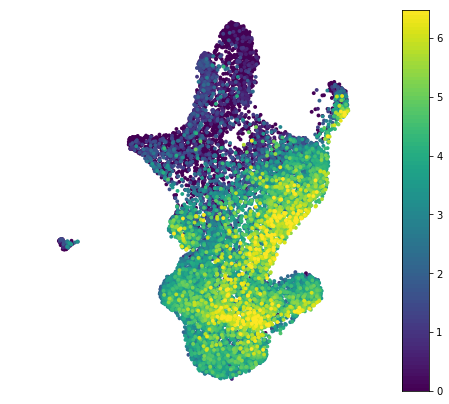

In [34]:
g = 'Lcn2'
expr = pdX.loc[g, c_young]
draw_scatter_expr(Xs[c_young].obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False)

figname = 'umap_exp_young_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

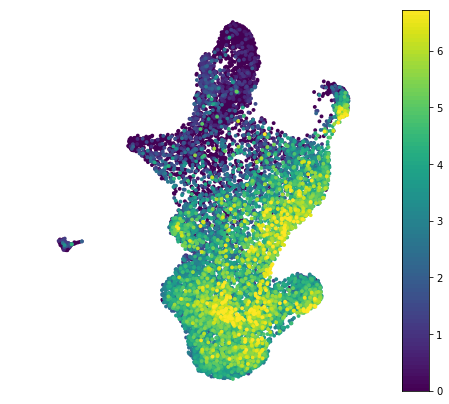

In [35]:
g = 'Lcn2'
expr = pdX.loc[g, c_aged]
draw_scatter_expr(Xs[c_aged].obsm['X_umap_pca'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False)

figname = 'umap_exp_aged_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

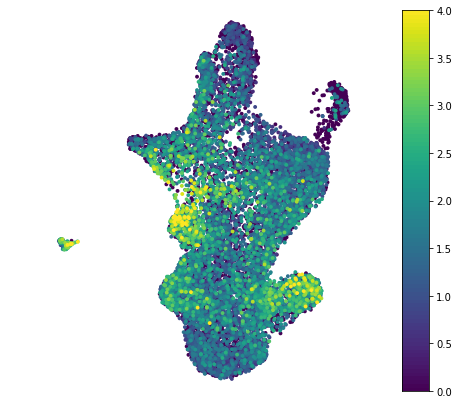

In [18]:
g = 'AC149090.1'
expr = pdX.loc[g, c_young]
draw_scatter_expr(Xs[c_young].obsm['X_umap_pca'],
                  expr,
                  0,
                  4,
                  text = '',
                  s = 15, show_axes=False)

figname = 'umap_exp_young_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

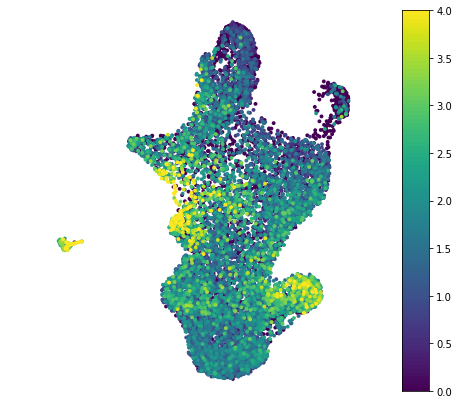

In [19]:
g = 'AC149090.1'
expr = pdX.loc[g, c_aged]
draw_scatter_expr(Xs[c_aged].obsm['X_umap_pca'],
                  expr,
                  0,
                  4,
                  text = '',
                  s = 15, show_axes=False)

figname = 'umap_exp_aged_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

# Violin plots - AT2

In [20]:
c_sel_AT2 = Xs.obs[Xs.obs['cl_epithelial_tumor_pca']=='AT2'].index

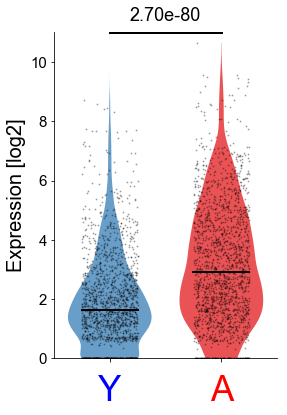

In [128]:
g = 'Scgb1a1'
data = pdX.loc[g, c_sel_AT2]
groups = Xs.obs['age'][c_sel_AT2]
gr_order = ['young','aged']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,11)
    
#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))


#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))
ax.set_xticklabels([])
ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')

ax.set_ylim(data.values.min(), data.max())
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
        ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
        ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
    
#plot data

for_stats = []

for p, i in enumerate(gr_order):

    i_tmp = groups[groups==i].index
    d_tmp = data[i_tmp].values
    for_stats.append(d_tmp)
        
    if scatter:
         ax.scatter([p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                    d_tmp,
                    color = 'k',
                    s = 1,
                    alpha = 0.25,
                    zorder = 1)

    violin = ax.violinplot([d_tmp],
                            positions = [p],
                            vert=True,
                            showextrema=False,
                            widths=0.75)

    for v in violin['bodies']:
        v.set_facecolor(cmap[i])
        v.set_linewidth(0)
        v.set_alpha(0.75)
        v.set_zorder(0)

    ax.plot([p-0.25,p+0.25],[np.median(d_tmp),np.median(d_tmp)], color = 'k', linewidth = 2)
    
ax.set_ylim(ylim)
ax.plot([0,1],[ylim[1],ylim[1]], color = 'k', linewidth = 3)
pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
pval_str = '%s.%se%s' % (str(pval).split('.')[0], str(pval).split('.')[1][0:2], str(pval).split('e')[-1])
ax.text(0.5, ylim[1]*1.05, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')

figname = 'violin_AT2_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

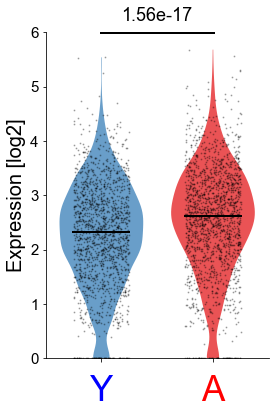

In [129]:
g = 'Nupr1'
data = pdX.loc[g, c_sel_AT2]
groups = Xs.obs['age'][c_sel_AT2]
gr_order = ['young','aged']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,6)
    
#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))


#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))
ax.set_xticklabels([])
ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')

ax.set_ylim(data.values.min(), data.max())
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
        ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
        ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
    
#plot data

for_stats = []

for p, i in enumerate(gr_order):

    i_tmp = groups[groups==i].index
    d_tmp = data[i_tmp].values
    for_stats.append(d_tmp)
        
    if scatter:
         ax.scatter([p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                    d_tmp,
                    color = 'k',
                    s = 1,
                    alpha = 0.25,
                    zorder = 1)

    violin = ax.violinplot([d_tmp],
                            positions = [p],
                            vert=True,
                            showextrema=False,
                            widths=0.75)

    for v in violin['bodies']:
        v.set_facecolor(cmap[i])
        v.set_linewidth(0)
        v.set_alpha(0.75)
        v.set_zorder(0)

    ax.plot([p-0.25,p+0.25],[np.median(d_tmp),np.median(d_tmp)], color = 'k', linewidth = 2)
    
ax.set_ylim(ylim)
ax.plot([0,1],[ylim[1],ylim[1]], color = 'k', linewidth = 3)
pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
pval_str = '%s.%se%s' % (str(pval).split('.')[0], str(pval).split('.')[1][0:2], str(pval).split('e')[-1])
ax.text(0.5, ylim[1]*1.05, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')

figname = 'violin_AT2_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

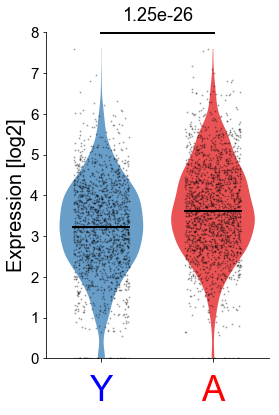

In [130]:
g = 'Lcn2'
data = pdX.loc[g, c_sel_AT2]
groups = Xs.obs['age'][c_sel_AT2]
gr_order = ['young','aged']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,8)
    
#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))


#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))
ax.set_xticklabels([])
ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')

ax.set_ylim(data.values.min(), data.max())
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
        ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
        ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
    
#plot data

for_stats = []

for p, i in enumerate(gr_order):

    i_tmp = groups[groups==i].index
    d_tmp = data[i_tmp].values
    for_stats.append(d_tmp)
        
    if scatter:
         ax.scatter([p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                    d_tmp,
                    color = 'k',
                    s = 1,
                    alpha = 0.25,
                    zorder = 1)

    violin = ax.violinplot([d_tmp],
                            positions = [p],
                            vert=True,
                            showextrema=False,
                            widths=0.75)

    for v in violin['bodies']:
        v.set_facecolor(cmap[i])
        v.set_linewidth(0)
        v.set_alpha(0.75)
        v.set_zorder(0)

    ax.plot([p-0.25,p+0.25],[np.median(d_tmp),np.median(d_tmp)], color = 'k', linewidth = 2)
    
ax.set_ylim(ylim)
ax.plot([0,1],[ylim[1],ylim[1]], color = 'k', linewidth = 3)
pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
pval_str = '%s.%se%s' % (str(pval).split('.')[0], str(pval).split('.')[1][0:2], str(pval).split('e')[-1])
ax.text(0.5, ylim[1]*1.05, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')

figname = 'violin_AT2_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

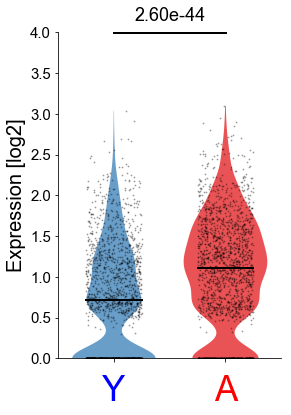

In [22]:
g = 'AC149090.1'
data = pdX.loc[g, c_sel_AT2]
groups = Xs.obs['age'][c_sel_AT2]
gr_order = ['young','aged']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,4)
    
#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))


#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))
ax.set_xticklabels([])
ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')

ax.set_ylim(data.values.min(), data.max())
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
        ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
        ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
    
#plot data

for_stats = []

for p, i in enumerate(gr_order):

    i_tmp = groups[groups==i].index
    d_tmp = data[i_tmp].values
    for_stats.append(d_tmp)
        
    if scatter:
         ax.scatter([p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                    d_tmp,
                    color = 'k',
                    s = 1,
                    alpha = 0.25,
                    zorder = 1)

    violin = ax.violinplot([d_tmp],
                            positions = [p],
                            vert=True,
                            showextrema=False,
                            widths=0.75)

    for v in violin['bodies']:
        v.set_facecolor(cmap[i])
        v.set_linewidth(0)
        v.set_alpha(0.75)
        v.set_zorder(0)

    ax.plot([p-0.25,p+0.25],[np.median(d_tmp),np.median(d_tmp)], color = 'k', linewidth = 2)
    
ax.set_ylim(ylim)
ax.plot([0,1],[ylim[1],ylim[1]], color = 'k', linewidth = 3)
pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
pval_str = '%s.%se%s' % (str(pval).split('.')[0], str(pval).split('.')[1][0:2], str(pval).split('e')[-1])
ax.text(0.5, ylim[1]*1.05, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')

figname = 'violin_AT2_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

# Violin plots - LUAD

In [24]:
c_sel_LUAD = Xs.obs[~Xs.obs['cl_epithelial_tumor_pca'].isin(['AT2','AT1','Ciliated',])].index

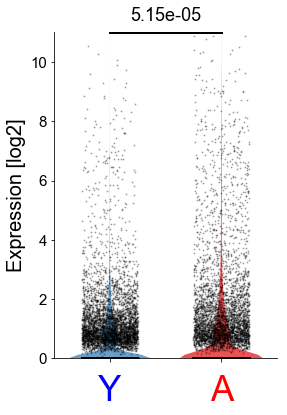

In [132]:
g = 'Scgb1a1'
data = pdX.loc[g, c_sel_LUAD]
groups = Xs.obs['age'][c_sel_LUAD]
gr_order = ['young','aged']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,11)
    
#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))


#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))
ax.set_xticklabels([])
ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')

ax.set_ylim(data.values.min(), data.max())
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
        ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
        ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
    
#plot data

for_stats = []

for p, i in enumerate(gr_order):

    i_tmp = groups[groups==i].index
    d_tmp = data[i_tmp].values
    for_stats.append(d_tmp)
        
    if scatter:
         ax.scatter([p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                    d_tmp,
                    color = 'k',
                    s = 1,
                    alpha = 0.25,
                    zorder = 1)

    violin = ax.violinplot([d_tmp],
                            positions = [p],
                            vert=True,
                            showextrema=False,
                            widths=0.75)

    for v in violin['bodies']:
        v.set_facecolor(cmap[i])
        v.set_linewidth(0)
        v.set_alpha(0.75)
        v.set_zorder(0)

    ax.plot([p-0.25,p+0.25],[np.median(d_tmp),np.median(d_tmp)], color = 'k', linewidth = 2)
    
ax.set_ylim(ylim)
ax.plot([0,1],[ylim[1],ylim[1]], color = 'k', linewidth = 3)
pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
pval_str = '%s.%se%s' % (str(pval).split('.')[0], str(pval).split('.')[1][0:2], str(pval).split('e')[-1])
ax.text(0.5, ylim[1]*1.05, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')

figname = 'violin_LUAD_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

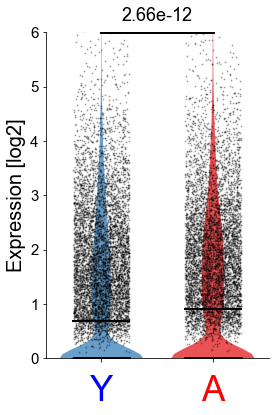

In [133]:
g = 'Nupr1'
data = pdX.loc[g, c_sel_LUAD]
groups = Xs.obs['age'][c_sel_LUAD]
gr_order = ['young','aged']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,6)
    
#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))


#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))
ax.set_xticklabels([])
ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')

ax.set_ylim(data.values.min(), data.max())
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
        ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
        ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
    
#plot data

for_stats = []

for p, i in enumerate(gr_order):

    i_tmp = groups[groups==i].index
    d_tmp = data[i_tmp].values
    for_stats.append(d_tmp)
        
    if scatter:
         ax.scatter([p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                    d_tmp,
                    color = 'k',
                    s = 1,
                    alpha = 0.25,
                    zorder = 1)

    violin = ax.violinplot([d_tmp],
                            positions = [p],
                            vert=True,
                            showextrema=False,
                            widths=0.75)

    for v in violin['bodies']:
        v.set_facecolor(cmap[i])
        v.set_linewidth(0)
        v.set_alpha(0.75)
        v.set_zorder(0)

    ax.plot([p-0.25,p+0.25],[np.median(d_tmp),np.median(d_tmp)], color = 'k', linewidth = 2)
    
ax.set_ylim(ylim)
ax.plot([0,1],[ylim[1],ylim[1]], color = 'k', linewidth = 3)
pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
pval_str = '%s.%se%s' % (str(pval).split('.')[0], str(pval).split('.')[1][0:2], str(pval).split('e')[-1])
ax.text(0.5, ylim[1]*1.05, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')

figname = 'violin_LUAD_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

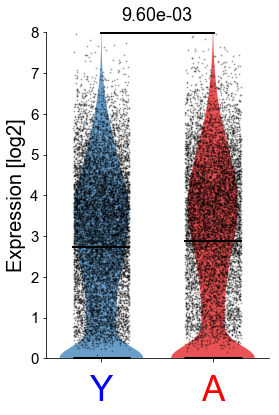

In [135]:
g = 'Lcn2'
data = pdX.loc[g, c_sel_LUAD]
groups = Xs.obs['age'][c_sel_LUAD]
gr_order = ['young','aged']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,8)
    
#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))


#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))
ax.set_xticklabels([])
ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')

ax.set_ylim(data.values.min(), data.max())
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
        ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
        ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
    
#plot data

for_stats = []

for p, i in enumerate(gr_order):

    i_tmp = groups[groups==i].index
    d_tmp = data[i_tmp].values
    for_stats.append(d_tmp)
        
    if scatter:
         ax.scatter([p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                    d_tmp,
                    color = 'k',
                    s = 1,
                    alpha = 0.25,
                    zorder = 1)

    violin = ax.violinplot([d_tmp],
                            positions = [p],
                            vert=True,
                            showextrema=False,
                            widths=0.75)

    for v in violin['bodies']:
        v.set_facecolor(cmap[i])
        v.set_linewidth(0)
        v.set_alpha(0.75)
        v.set_zorder(0)

    ax.plot([p-0.25,p+0.25],[np.median(d_tmp),np.median(d_tmp)], color = 'k', linewidth = 2)
    
ax.set_ylim(ylim)
ax.plot([0,1],[ylim[1],ylim[1]], color = 'k', linewidth = 3)
pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
pval = "{:e}".format(pval)
pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
ax.text(0.5, ylim[1]*1.05, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')

figname = 'violin_LUAD_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

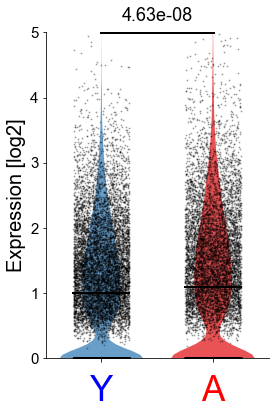

In [27]:
g = 'AC149090.1'
data = pdX.loc[g, c_sel_LUAD]
groups = Xs.obs['age'][c_sel_LUAD]
gr_order = ['young','aged']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,5)
    
#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))


#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))
ax.set_xticklabels([])
ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')

ax.set_ylim(data.values.min(), data.max())
ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
        ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
        ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
    
#plot data

for_stats = []

for p, i in enumerate(gr_order):

    i_tmp = groups[groups==i].index
    d_tmp = data[i_tmp].values
    for_stats.append(d_tmp)
        
    if scatter:
         ax.scatter([p-(i-0.5)/2 for i in np.random.rand(len(d_tmp), 1)],
                    d_tmp,
                    color = 'k',
                    s = 1,
                    alpha = 0.25,
                    zorder = 1)

    violin = ax.violinplot([d_tmp],
                            positions = [p],
                            vert=True,
                            showextrema=False,
                            widths=0.75)

    for v in violin['bodies']:
        v.set_facecolor(cmap[i])
        v.set_linewidth(0)
        v.set_alpha(0.75)
        v.set_zorder(0)

    ax.plot([p-0.25,p+0.25],[np.median(d_tmp),np.median(d_tmp)], color = 'k', linewidth = 2)
    
ax.set_ylim(ylim)
ax.plot([0,1],[ylim[1],ylim[1]], color = 'k', linewidth = 3)
pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
pval = "{:e}".format(pval)
pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
ax.text(0.5, ylim[1]*1.05, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')

figname = 'violin_LUAD_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

# Plot violins for each cluster 

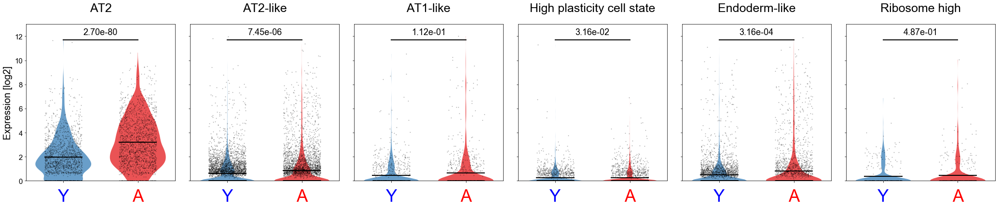

In [121]:
g = 'Scgb1a1'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,13)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)
    
    ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
    pval = "{:e}".format(pval)
    pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

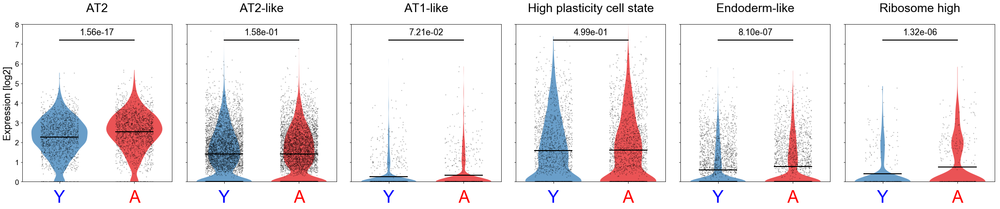

In [123]:
g = 'Nupr1'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,8)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)
    
    ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
    pval = "{:e}".format(pval)
    pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

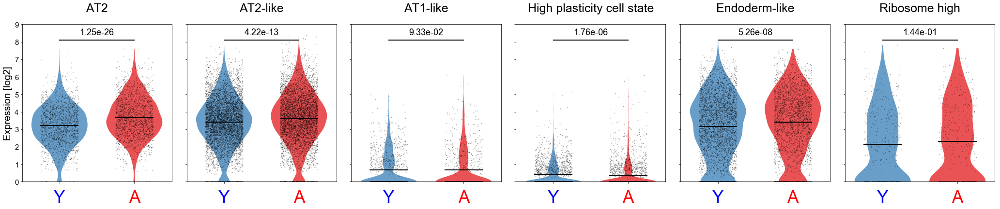

In [125]:
g = 'Lcn2'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,9)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)
    
    ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
    pval = "{:e}".format(pval)
    pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

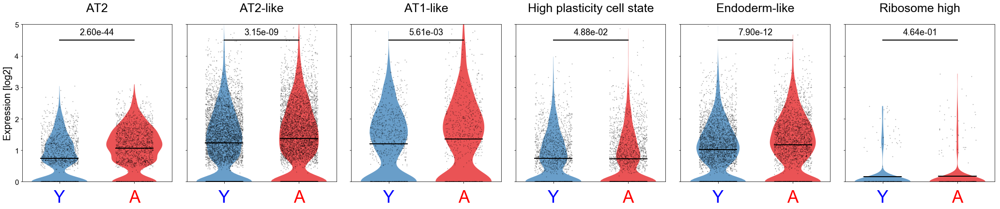

In [29]:
g = 'AC149090.1'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,5)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)
    
    ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
    pval = "{:e}".format(pval)
    pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

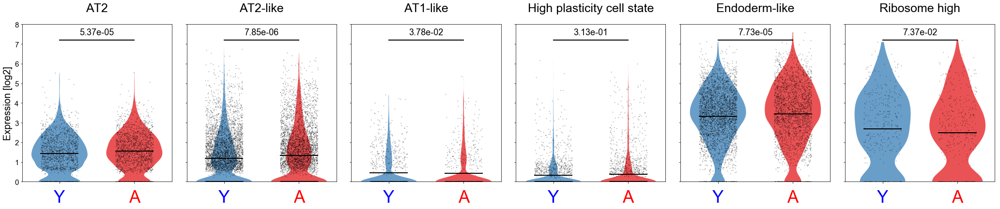

In [18]:
g = 'Trf'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,8)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)
    
    ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
    pval = "{:e}".format(pval)
    pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

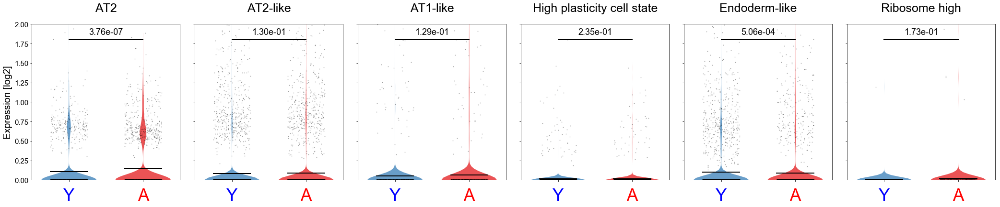

In [20]:
g = 'Slc22a17'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,2)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)
    
    ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
    pval = "{:e}".format(pval)
    pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0


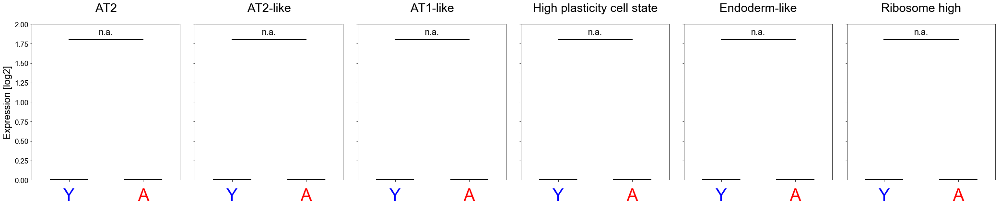

In [23]:
g = 'Mc4r'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,2)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

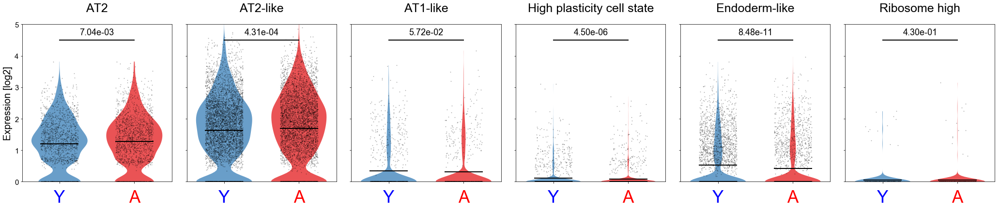

In [33]:
g = 'Lrp2'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,5)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

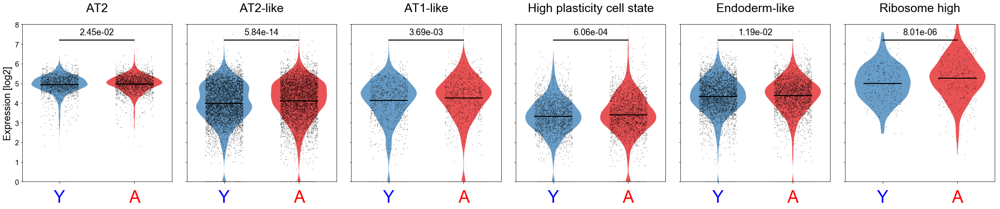

In [34]:
g = 'Fth1'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,8)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

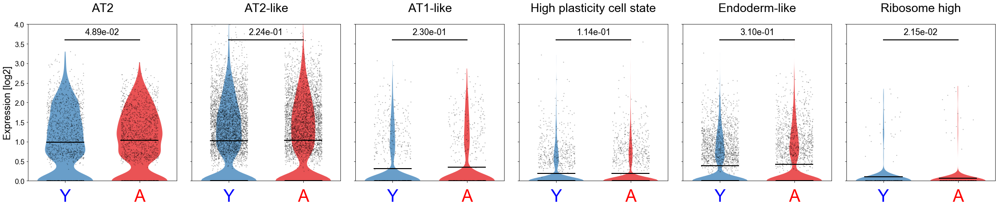

In [35]:
g = 'Tfrc'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,4)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

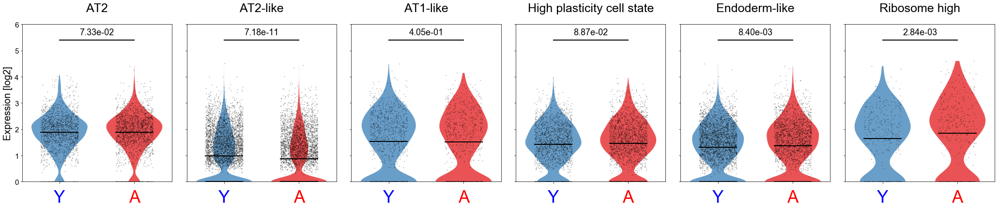

In [36]:
g = 'Gpx4'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,6)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

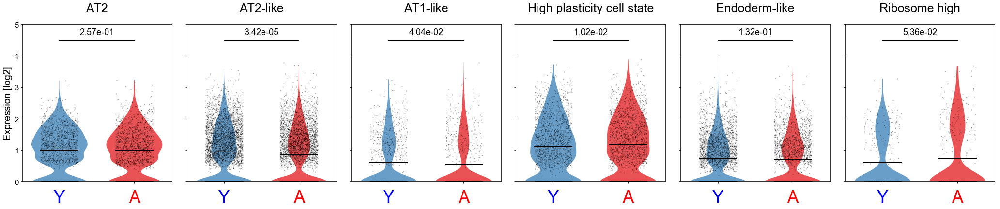

In [37]:
g = 'Atf4'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,5)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

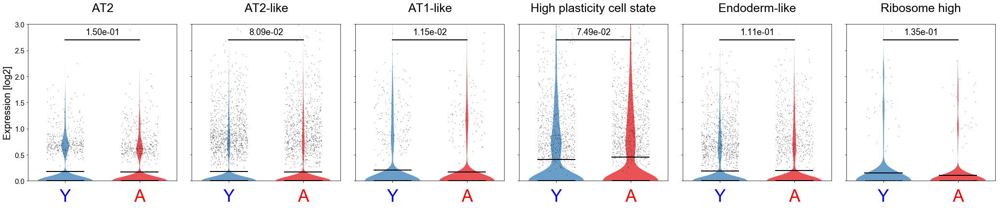

In [38]:
g = 'Ddit3'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,3)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

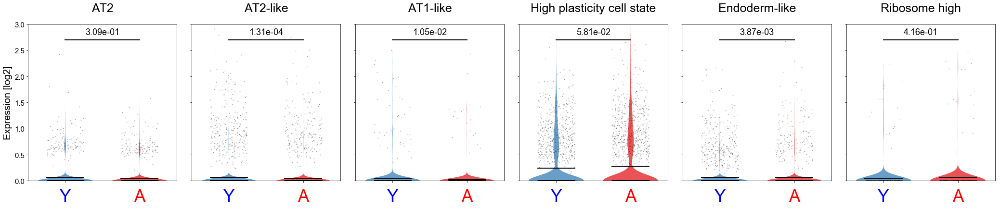

In [39]:
g = 'Trib3'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,3)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

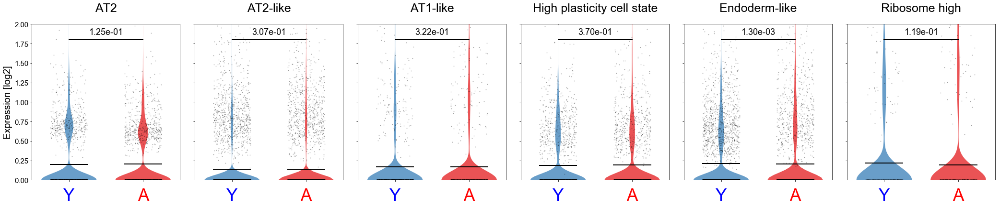

In [31]:
g = 'Nfs1'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,2)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

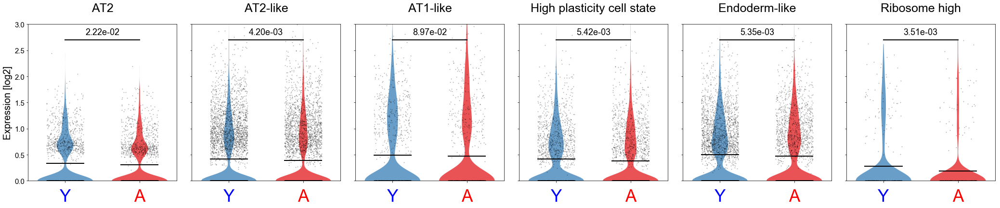

In [41]:
g = 'Aco1'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,3)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

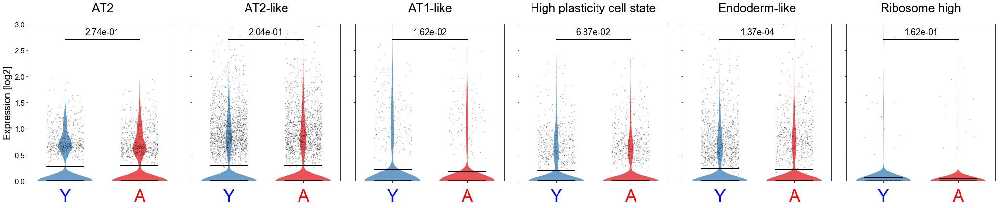

In [43]:
g = 'Ireb2'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,3)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 

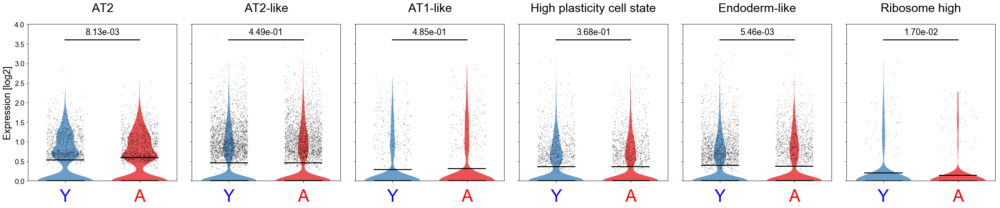

In [45]:
g = 'Fbxl5'
data = pdX.loc[g]
groups = Xs.obs['cl_epithelial_tumor_pca']
gr_order = ['AT2','AT2-like','AT1-like','High plasticity cell state','Endoderm-like','Ribosome high']
ages = Xs.obs['age']
scatter=True
cmap = cmap_age
L = len(gr_order)
ylim = (0,4)
                
#initialize figure

height = 6
width = 6 * L

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(1, L, wspace=0.1)

#iterate over clusters

for i,c in enumerate(gr_order):
    
    cl_tmp = groups[groups==c].index
    
    ax = plt.subplot(gs[i])
    
    #define axis
    
    ax.set_xlim(-0.5, 1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels([])
    ax.text(0, -ylim[1]*0.05, 'Y', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='blue')
    ax.text(1, -ylim[1]*0.05, 'A', family = 'Arial', fontsize=35, rotation='horizontal', va = 'top', ha='center', color='red')
    
    ax.set_ylim(data.values.min(), data.max())
    if i == 0:
        ax.set_ylabel('Expression [log2]', family = 'Arial', fontsize = 20)
        for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
            ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
            ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)
    else:
        ax.set_yticklabels([])

    #ax.spines['right'].set_color('none')
    #ax.spines['top'].set_color('none')

    #plot data

    for_stats = []

    for p, a in enumerate(['young','aged']):
        
        i_tmp = ages[cl_tmp][ages[cl_tmp]==a].index
        d_tmp = data[i_tmp].values
        for_stats.append(d_tmp)
        
        if scatter:
             ax.scatter([p-(q-0.5)/2 for q in np.random.rand(len(d_tmp), 1)],
                        d_tmp,
                        color = 'k',
                        s = 1,
                        alpha = 0.25,
                        zorder = 1)
    
        violin = ax.violinplot([d_tmp],
                                positions = [p],
                                vert=True,
                                showextrema=False,
                                widths=0.75)

        for v in violin['bodies']:
            v.set_facecolor(cmap[a])
            v.set_linewidth(0)
            v.set_alpha(0.75)
            v.set_zorder(0)

        ax.plot([p-0.25,p+0.25],[np.mean(d_tmp),np.mean(d_tmp)], color = 'k', linewidth = 2)

        ax.set_ylim(ylim)
    ax.plot([0,1],[ylim[1]*0.9,ylim[1]*0.9], color = 'k', linewidth = 2)
    try:
        pval = scipy.stats.mannwhitneyu(for_stats[0],for_stats[1])[1]
        pval = "{:e}".format(pval)
        pval_str = '%s.%se%s' % (pval.split('.')[0], pval.split('.')[1][0:2], pval.split('e')[-1])
    except:
        pval_str = 'n.a.'
    ax.text(0.5, ylim[1]*0.95, pval_str, family = 'Arial', fontsize=18, va='center', ha='center')
    
    
    ax.text(0.5, ylim[1]*1.1, c, family = 'Arial', fontsize=25, va='center', ha='center')
    
figname = 'violin_pops_%s.png' % g
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'png',
            dpi=300,
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True) 